<a href="https://colab.research.google.com/github/DeF0017/Neural-Style-Transfer/blob/main/Neural_Style_Transfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import PIL
import tensorflow as tf
from matplotlib.pyplot import imshow
from PIL import Image
from tensorflow.python.framework.ops import EagerTensor
import pprint

In [2]:
tf.random.set_seed(272)
pp = pprint.PrettyPrinter(indent=4)
img_size = 400
vgg = tf.keras.applications.VGG19(include_top=False, input_shape=(img_size,img_size,3),weights='/content/vgg19_weights_tf_dim_ordering_tf_kernels_notop.h5')
vgg.trainable=False
pp.pprint(vgg)

In [3]:
vgg.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 400, 400, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 400, 400, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 400, 400, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 200, 200, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 200, 200, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 200, 200, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 100, 100, 128)     0     

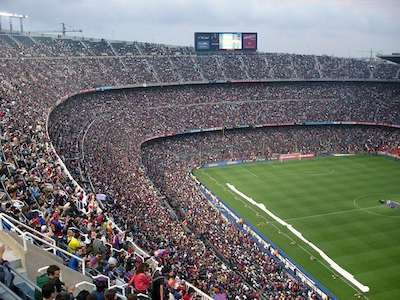

In [4]:
content_image = Image.open("/content/camp-nou.jpg")
content_image

In [5]:
def compute_content_cost(content_output, generated_output):
  a_C = content_output[-1]
  a_G = generated_output[-1]
  m, n_H, n_W, n_C = a_G.get_shape().as_list()
  a_C_unrolled = tf.reshape(a_C, shape=[m, n_H * n_W, n_C])
  a_G_unrolled = tf.reshape(a_G, shape=[m, n_H * n_W, n_C])
  J_content =  tf.reduce_sum(tf.square(a_C_unrolled - a_G_unrolled))/(4.0 * n_H * n_W * n_C)
  return J_content

In [6]:
tf.random.set_seed(1)
a_C = tf.random.normal([1, 4, 4, 3], mean=1, stddev=4)
a_G = tf.random.normal([1, 4, 4, 3], mean=1, stddev=4)
J_content = compute_content_cost([a_C], [a_G])
print("J_content = " + str(J_content))

J_content = tf.Tensor(7.056877, shape=(), dtype=float32)


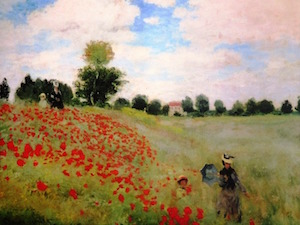

In [7]:
style_image = Image.open("/content/claude-monet.jpg")
style_image

In [8]:
def gram_matrix(A):
    """
    Argument:
    A -- matrix of shape (n_C, n_H*n_W)

    Returns:
    GA -- Gram matrix of A, of shape (n_C, n_C)
    """
    GA = tf.matmul(A, tf.transpose(A))
    return GA

In [9]:
def compute_style_cost(a_S, a_G):
  m, n_H, n_W, n_C = a_G.get_shape().as_list()
  a_S = tf.transpose(tf.reshape(a_S , shape=(-1,n_C)))
  a_G = tf.transpose(tf.reshape(a_G , shape=(-1,n_C)))
  gramS = gram_matrix(a_S)
  gramG = gram_matrix(a_G)
  J_style = tf.reduce_sum(tf.square(gramS-gramG)/(4.0 *(( n_H * n_W * n_C)**2)))
  return J_style

In [10]:
tf.random.set_seed(1)
a_S = tf.random.normal([1, 4, 4, 3], mean=1, stddev=4)
a_G = tf.random.normal([1, 4, 4, 3], mean=1, stddev=4)
J_style_layer_SG = compute_style_cost(a_S, a_G)
print("J_style_layer = " + str(J_style_layer_SG))

J_style_layer = tf.Tensor(14.017806, shape=(), dtype=float32)


In [11]:
for layer in vgg.layers:
  print(layer.name)

input_1
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


In [12]:
vgg.get_layer('block5_conv4').output

<KerasTensor: shape=(None, 25, 25, 512) dtype=float32 (created by layer 'block5_conv4')>

In [13]:
STYLE_LAYERS = [
    ('block1_conv1', 1.0),
    ('block2_conv1', 0.8),
    ('block3_conv1', 0.7),
    ('block4_conv1', 0.2),
    ('block5_conv1', 0.1)]

In [14]:
def compute_total_style_cost(aS, aG, style_layers=STYLE_LAYERS):
  J_style = 0
  a_S = aS[1:]
  a_G = aG[1:]
  for i,weight in zip(range(len(a_S)),style_layers):
    J = compute_style_cost(a_S[i],a_G[i])
    J_style += weight[1]*J
  return J_style

In [15]:
def total_cost(J_content, J_style, alpha = 10, beta = 40):
    """
    Computes the total cost function

    Arguments:
    J_content -- content cost coded above
    J_style -- style cost coded above
    alpha -- hyperparameter weighting the importance of the content cost
    beta -- hyperparameter weighting the importance of the style cost

    Returns:
    J -- total cost as defined by the formula above.
    """
    J = alpha * J_content + beta * J_style
    return J

In [16]:
J_content = 0.2
J_style = 0.8
np.random.seed(1)
J = total_cost(J_content, J_style)
print(J)

34.0


(1, 400, 400, 3)


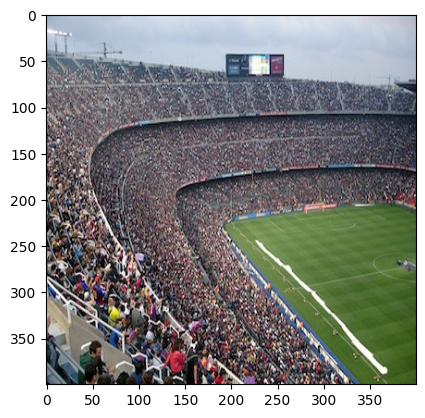

In [17]:
content_image = np.array(Image.open("/content/camp-nou.jpg").resize((img_size, img_size)))
content_image = tf.constant(np.reshape(content_image, ((1,) + content_image.shape)))
print(content_image.shape)
imshow(content_image[0])
plt.show()

(1, 400, 400, 3)


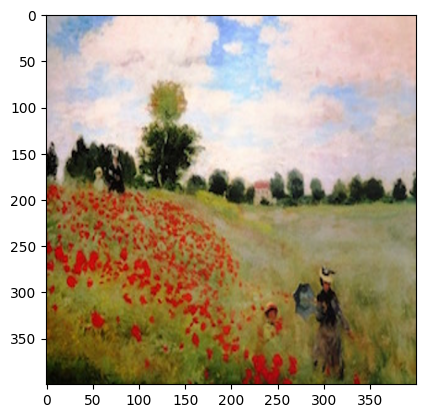

In [18]:
style_image =  np.array(Image.open("/content/claude-monet.jpg").resize((img_size, img_size)))
style_image = tf.constant(np.reshape(style_image, ((1,) + style_image.shape)))
print(style_image.shape)
imshow(style_image[0])
plt.show()

(1, 400, 400, 3)


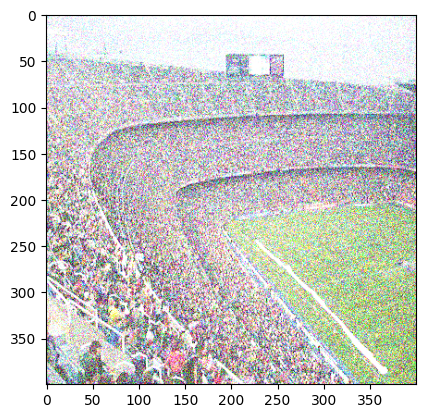

In [19]:
generated_image = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
noise = tf.random.uniform(tf.shape(generated_image), 0, 0.8)
generated_image = tf.add(generated_image, noise)
generated_image = tf.clip_by_value(generated_image, clip_value_min=0.0, clip_value_max=1.0)

print(generated_image.shape)
imshow(generated_image.numpy()[0])
plt.show()

In [20]:
def get_layer_outputs(vgg, layer_names):
    """ Creates a vgg model that returns a list of intermediate output values."""
    # layer_names has 'layer' elements in it.
    outputs = [vgg.get_layer(layer[0]).output for layer in layer_names]

    model = tf.keras.Model([vgg.input], outputs)
    return model

In [21]:
content_layer = [('block5_conv4', 1)]

vgg_model_outputs = get_layer_outputs(vgg, STYLE_LAYERS + content_layer)

In [22]:
content_target = vgg_model_outputs(content_image)  # Content encoder
style_targets = vgg_model_outputs(style_image)     # Style enconder

In [23]:
preprocessed_content =  tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
a_C = vgg_model_outputs(preprocessed_content)

# Set a_G to be the hidden layer activation from same layer. Here, a_G references model['conv4_2']
# and isn't evaluated yet. Later in the code, we'll assign the image G as the model input.
a_G = vgg_model_outputs(generated_image)

# Compute the content cost
J_content = compute_content_cost(a_C, a_G)

print(J_content)

tf.Tensor(0.009744642, shape=(), dtype=float32)


In [24]:
preprocessed_style =  tf.Variable(tf.image.convert_image_dtype(style_image, tf.float32))
a_S = vgg_model_outputs(preprocessed_style)
print(len(a_S))
print(len(a_G))
# Compute the style cost
J_style = compute_total_style_cost(a_S, a_G)
print(J_style)

6
6
tf.Tensor(3763.8108, shape=(), dtype=float32)


In [25]:
def clip_0_1(image):
    """
    Truncate all the pixels in the tensor to be between 0 and 1

    Arguments:
    image -- Tensor
    J_style -- style cost coded above

    Returns:
    Tensor
    """
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

def tensor_to_image(tensor):
    """
    Converts the given tensor into a PIL image

    Arguments:
    tensor -- Tensor

    Returns:
    Image: A PIL image
    """
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return Image.fromarray(tensor)

In [26]:
optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=0.01)
def train_step(generated_image, alpha = 10, beta = 40):
    with tf.GradientTape() as tape:
        # In this function you must use the precomputed encoded images a_S and a_C
        # Compute a_G as the vgg_model_outputs for the current generated image

        ### START CODE HERE

        #(1 line)
        a_G = vgg_model_outputs(generated_image)

        # Compute the style cost
        #(1 line)
        J_style = compute_total_style_cost(a_S, a_G)

        #(2 lines)
        # Compute the content cost
        J_content = compute_content_cost(a_C, a_G)
        # Compute the total cost
        J = total_cost(J_content, J_style,alpha = alpha, beta = beta)
    grad = tape.gradient(J, generated_image)
    optimizer.apply_gradients([(grad, generated_image)])
    generated_image.assign(clip_0_1(generated_image))
    return J

In [27]:
generated_image = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))

J1 = train_step(generated_image)
print(J1)
J2 = train_step(generated_image)
print(J2)

tf.Tensor(44487.188, shape=(), dtype=float32)
tf.Tensor(32121.24, shape=(), dtype=float32)


Epoch 0 


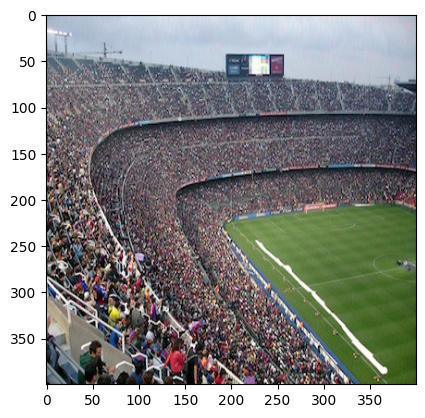

Epoch 250 


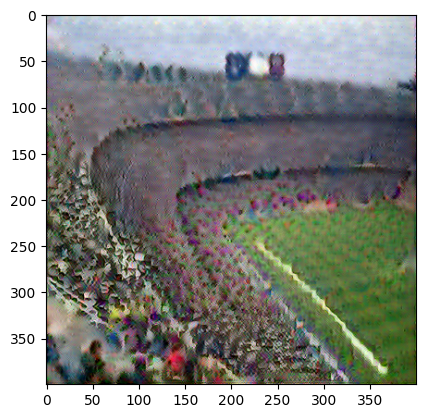

Epoch 500 


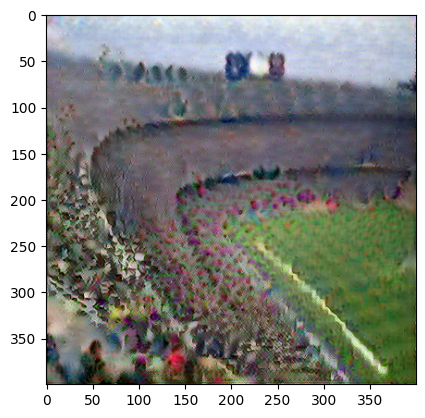

Epoch 750 


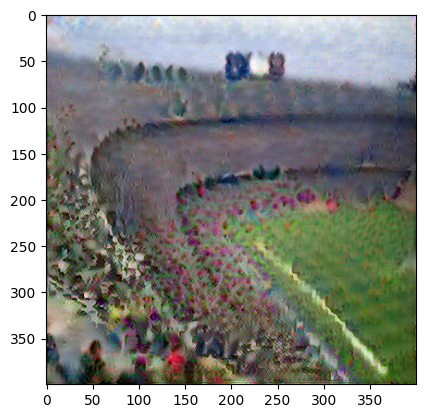

Epoch 1000 


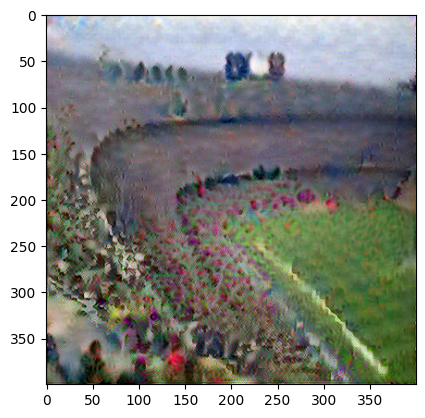

Epoch 1250 


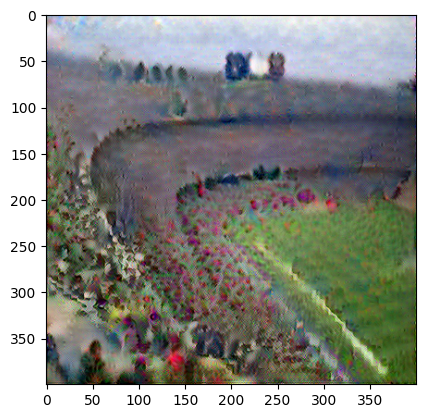

Epoch 1500 


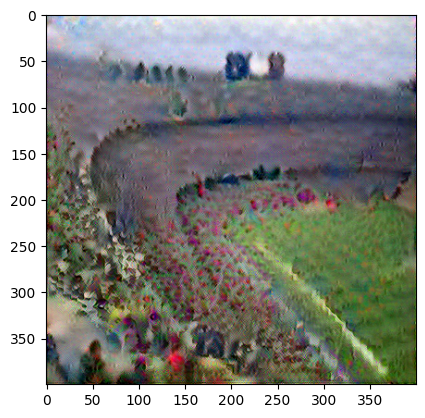

Epoch 1750 


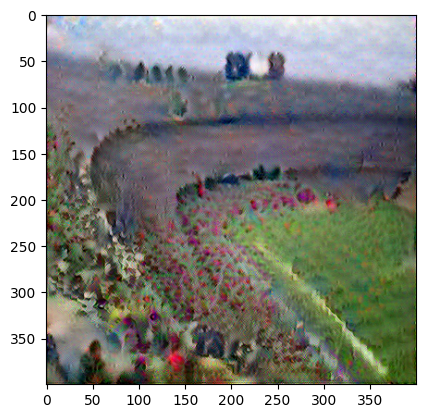

Epoch 2000 


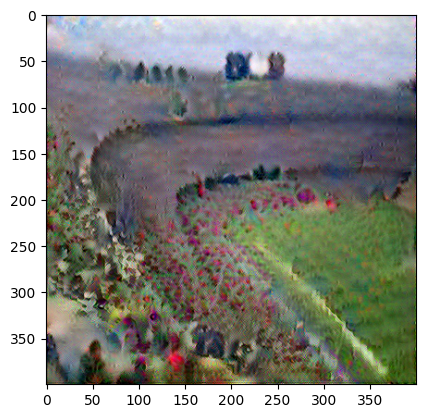

Epoch 2250 


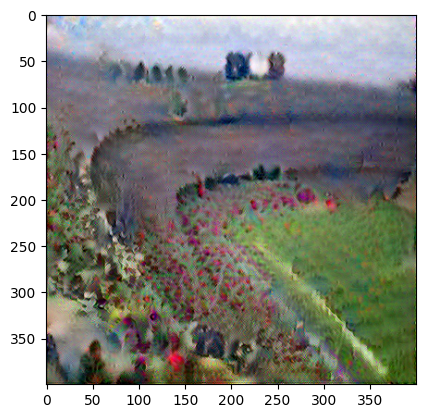

Epoch 2500 


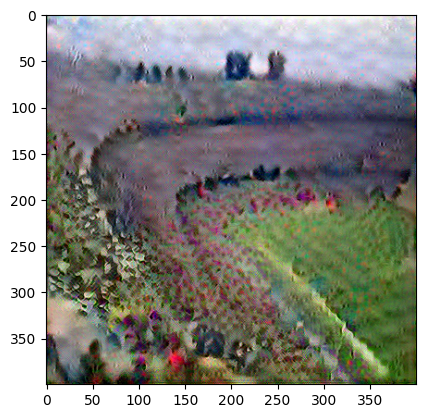

Epoch 2750 


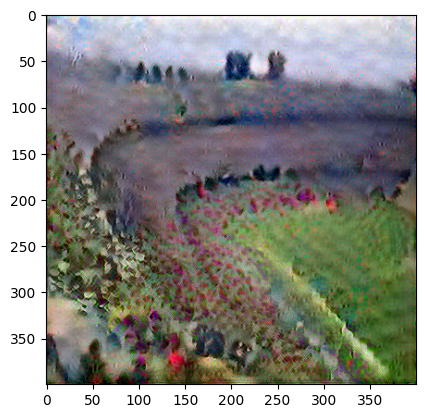

Epoch 3000 


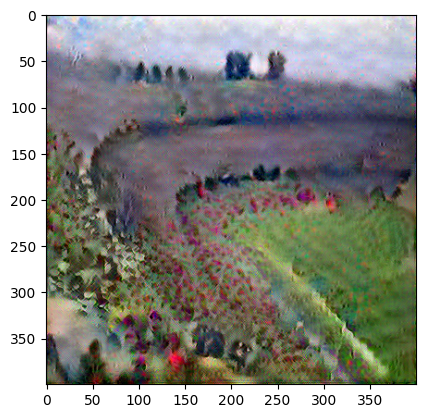

Epoch 3250 


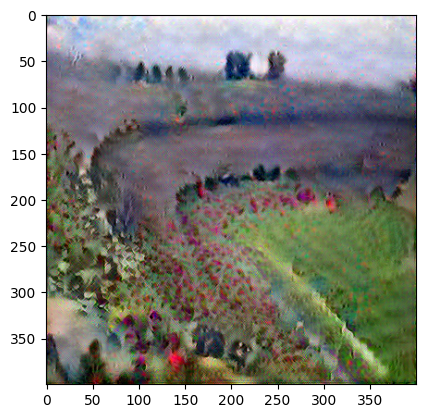

Epoch 3500 


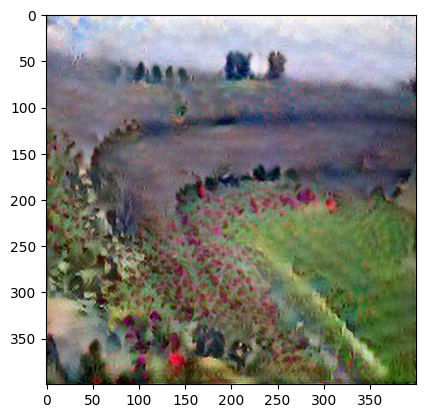

Epoch 3750 


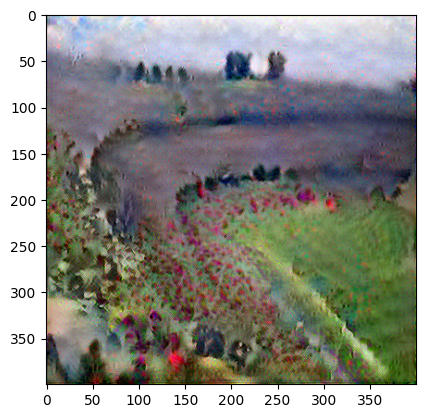

Epoch 4000 


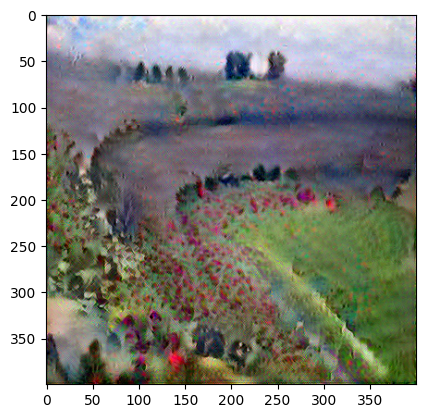

Epoch 4250 


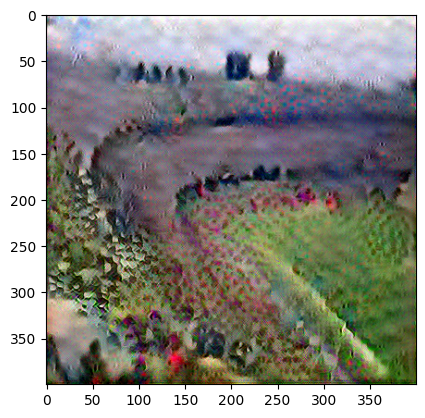

Epoch 4500 


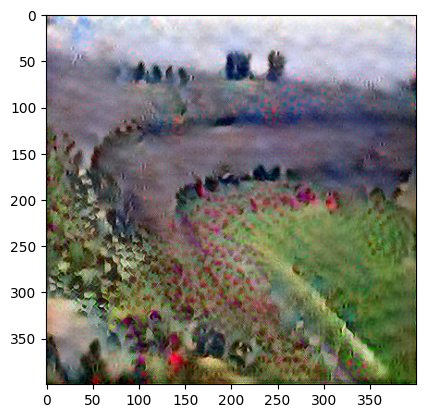

Epoch 4750 


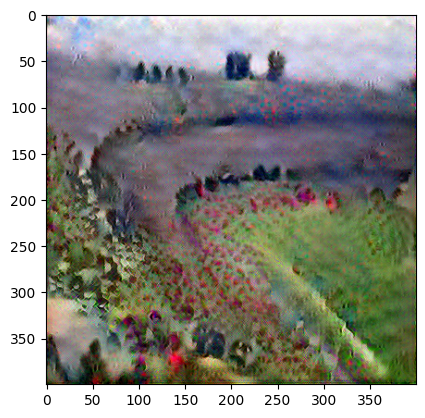

Epoch 5000 


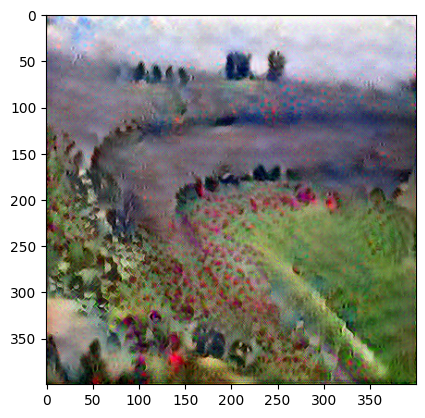

In [28]:
generated_image = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))

epochs = 5001
for i in range(epochs):
  train_step(generated_image,alpha = 100, beta = 100)
  if i%250==0:
    print(f"Epoch {i} ")
    image = tensor_to_image(generated_image)
    imshow(image)
    plt.show()